# Dependencies

In [243]:
import numpy as np
import pandas as pd
import seaborn as sns
from mesa import Agent, Model, agent
from mesa.space import MultiGrid
from mesa.time import RandomActivation
from mesa.datacollection import DataCollector

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Setup

In [244]:
SEED = 67890
RNG = np.random.default_rng(SEED)

# Warehouse
HEIGHT = 20
WIDTH = 20

# Box params
MAX_BOXES_PER_CELL = 3
TOTAL_BOXES = 200
BOX_STACK_SIZE = 5

# Robot params
ROBOTS = 5
MOORE = False

# COLOR ID
EMPTY_CELL_COLOR_ID = 0
ROBOT_COLOR_ID = 1
BOX_COLOR_ID = 5

ITERATIONS = 100

# Definitions

## Aux functions
## Collection functions

In [245]:
def manhattan_distance(p1, p2):
    return abs(p1[0] - p2[0]) + abs(p1[1] - p2[1])

north = [(0,n) for n in range(WIDTH)]
south = [(HEIGHT-1,n) for n in range(WIDTH)]
east = [(n,WIDTH-1) for n in range(HEIGHT)]
west = [(n,0) for n in range(HEIGHT)]

wall_coords = [*north,*south,*east,*west]
WALL_COORDINATES = {(x_pos,y_pos): True for x_pos,y_pos in wall_coords}

def is_wall(pos):
    try:
        return WALL_COORDINATES[pos]
    except:
        return False

In [246]:
def get_grid(model):
    agent_counts = np.zeros((model.grid.width, model.grid.height), dtype=int)
    for cell_content, (x, y) in model.grid.coord_iter():
        if cell_content:
            agent_counts[x][y] = len(cell_content)
            for a in cell_content:
                if a.unique_id < 5:
                     agent_counts[x][y] = 10 + a.unique_id
    return agent_counts

## Box Agent

In [247]:
class Box(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.unique_id = unique_id
        self.grounded = True
        self.is_unmovable = False
        
    def is_full_stack(self):
        return len(self.model.grid.get_cell_list_contents(self.pos)) == MAX_BOXES_PER_CELL
    
    def step(self):
        self.is_unmovable = self.is_full_stack()
        pass

## Robot Agent

In [248]:
class RobotAgent(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.destination = None
        self.carrying_box = []
        self.stack_location = { stack_size: [] for stack_size in range(BOX_STACK_SIZE+1) }

    def count_boxes(self):
        for coords in self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False):
            cell_contents = self.model.grid.get_cell_list_contents(coords)
            box_count = 0
            for cell in cell_contents:
                if cell.unique_id >= ROBOTS:
                    box_count += 1
            if box_count <= BOX_STACK_SIZE:
                self.stack_location[box_count].append(coords)

    def is_reachable(self, location):
        x1, y1 = self.pos
        x2, y2 = location
        return ((x1 + 1 == x2 or x1-1 == x2) and (y1 == y2)) or ((y1 + 1 == y2 or y1-1 == y2) and (x1 == x2))
        
    def choose_any_box(self):
        for i in range(1,BOX_STACK_SIZE-1):
            if self.stack_location[i]:
                for coord in self.stack_location[i]:
                    if self.is_reachable(coord):
                        self.stack_location[i-1].append(coord)
                        self.stack_location[i].remove(coord)
                        agent_list = self.model.grid.get_cell_list_contents(coord)
                        if len(agent_list) > 0:
                            for a in agent_list:    
                                if a.unique_id >= ROBOTS:
                                    if a.grounded and not a.is_unmovable: 
                                        a.grounded = False
                                        return a

    def choose_stack(self):
        for i in range(BOX_STACK_SIZE-1, 0, -1):
            if self.stack_location[i]:
                for coord in self.stack_location[i]:
                    if self.is_reachable(coord):
                        return coord
                    elif manhattan_distance(self.pos,coord) <= 3:
                        return coord
        return None

    def place_down(self):
        box = self.carrying_box.pop()
        stack = self.choose_stack()
        if box is not None and stack is not None:
            box.grounded = True
            self.model.grid.move_agent(box, stack)

    def make_choice(self):
        if len(self.carrying_box) == 1:
            self.place_down()
        else:
            chosen_box = self.choose_any_box()
            if chosen_box:
                self.model.grid.move_agent(chosen_box, self.pos)
                self.carrying_box = [chosen_box]

    def get_empty_neighbors(self):
        neighbors = self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False)
        return [cell for cell in neighbors if self.model.grid.is_cell_empty(cell)]

    def move(self):
        self.model.grid.move_agent_to_one_of(self,self.get_empty_neighbors())

    def move_with_preference(self):
        moves = self.get_empty_neighbors()
        min_distance = 10
        if len(moves) > 0:
            chosen_move = moves[0]
            for i in range(BOX_STACK_SIZE-1,1,-1):
                if self.stack_location[i] is not None and moves is not None:
                    for coord in self.stack_location[i]:
                        if coord is not None:
                            for loc in moves:
                                if loc is not None:
                                    dist = manhattan_distance(coord,loc)
                                    if dist < min_distance:
                                        chosen_move = loc
            self.model.grid.move_agent(self,chosen_move)
        else:
            self.move()
            
    def move_opposite(self):
        # Get the neighboring cells
        neighbors = self.model.grid.get_neighborhood(
            self.pos,
            moore=False,
            include_center=False
        )

        for neighbor in neighbors:
            cell_contents = self.model.grid.get_cell_list_contents([neighbor])
            for content in cell_contents:
                if isinstance(content, Box) or isinstance(content, RobotAgent):
                     opposite = (-abs(self.pos[0] - content.pos[0]), -abs(self.pos[1] - content.pos[1]))
                     if not self.model.grid.out_of_bounds(opposite):
                        self.model.grid.move_agent(self,opposite)
                        return
        self.move()
            
        
    def step(self):
        self.count_boxes()
        self.make_choice()
        self.move_opposite()

## Warehouse Model

In [249]:
class WarehouseModel(Model):
    def __init__(self, width=WIDTH, height=HEIGHT, num_robots=ROBOTS, num_boxes=TOTAL_BOXES, seed=SEED):
        super().__init__(self, width, height, seed=seed)
        self.seed = seed
        self.grid = MultiGrid(width, height, torus=False)
        self.schedule = RandomActivation(self)

        for i in range(num_robots, num_robots + num_boxes):
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            if len(self.grid.get_cell_list_contents((x,y))) < MAX_BOXES_PER_CELL:
                box = Box(i, self)
                self.grid.place_agent(box, (x, y))
                self.schedule.add(box)

        for i in range(num_robots):
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            while len(self.grid.get_cell_list_contents([(x, y)])) > 0:
                x = self.random.randrange(self.grid.width)
                y = self.random.randrange(self.grid.height)
            robot = RobotAgent(i, self)
            self.grid.place_agent(robot, (x, y))
            self.schedule.add(robot)

        self.datacollector = DataCollector(
            model_reporters={"Grid": get_grid},
            agent_reporters={"Position":"pos"})

    def step(self):
        self.schedule.step()
        self.datacollector.collect(self)

In [250]:
model = WarehouseModel()
for iters in range(ITERATIONS):
    model.step()

In [251]:
robot_df = model.datacollector.get_agent_vars_dataframe()
robot_df.loc[ITERATIONS]

,Position
AgentID,
169,"(4, 1)"
92,"(2, 0)"
116,"(12, 0)"
59,"(3, 7)"
117,"(8, 2)"
...,...
199,"(2, 9)"
198,"(7, 10)"
33,"(1, 19)"


In [252]:
warehouse_df = model.datacollector.get_model_vars_dataframe()
warehouse_df

,Grid
0,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 10, 0, 0, 2, 0..."
1,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 10, 0, 2, 0..."
2,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0,..."
3,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0,..."
4,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 10, 2, 0..."
...,...
95,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
96,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
97,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
98,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."


In [253]:
np.sum(warehouse_df.iloc[0]["Grid"]) == np.sum(warehouse_df.iloc[ITERATIONS-1]["Grid"])

True

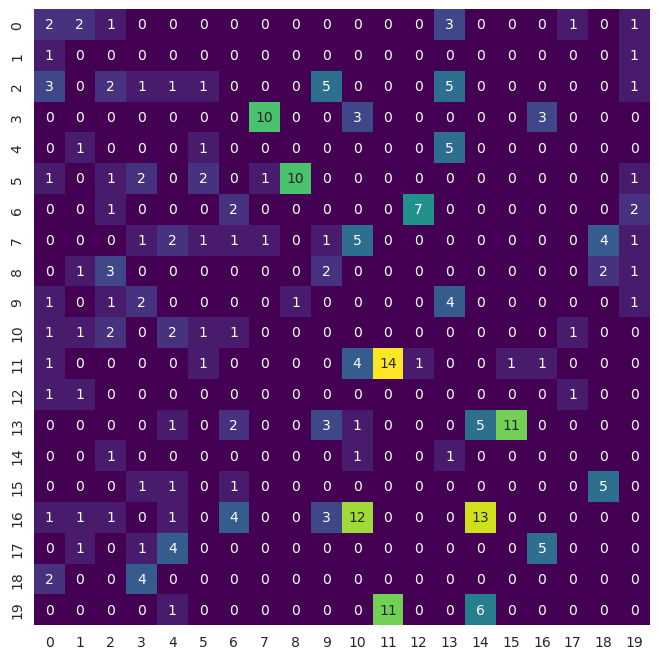

In [254]:
fig, axs = plt.subplots(figsize=(8, 8))
g = sns.heatmap(warehouse_df.iloc[ITERATIONS-1]["Grid"], cmap="viridis", annot=True, cbar=False, square=True, ax=axs)

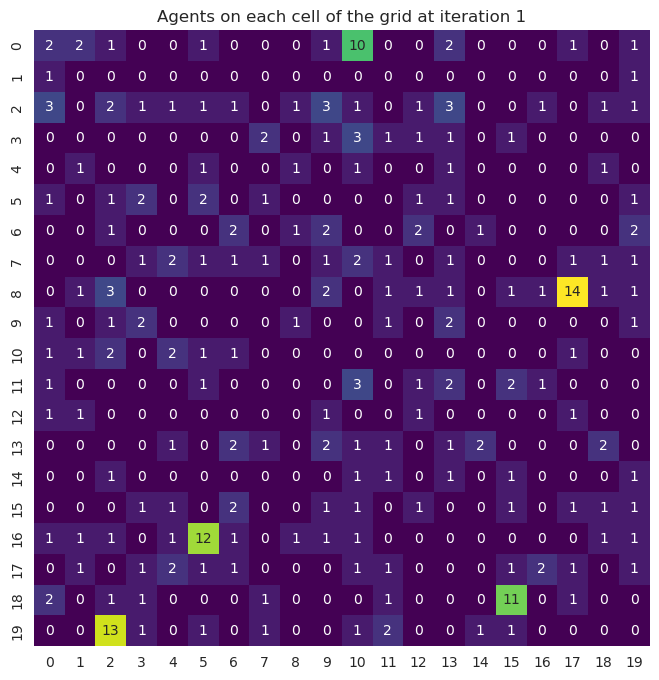

In [255]:
f, ax = plt.subplots(figsize=(8, 8))

def animate(i):
    ax.clear()
    frame = sns.heatmap(warehouse_df.iloc[i]["Grid"], cmap="viridis", annot=True, cbar=False, square=True, ax=ax)
    ax.set(title=f"Agents on each cell of the grid at iteration {i+1}")

anim = animation.FuncAnimation(f, animate, frames=ITERATIONS)

In [256]:
anim

# Visualization

In [257]:
#anim
from mesa.experimental import JupyterViz
from mesa import visualization

def agent_portrayal(agent):
    portrayal = {"Shape": "circle",
                 "Color": "red",
                 "Filled": "true",
                 "Layer": 0,
                 "r": 0.5}
    if agent.unique_id >= 4:
        portrayal["Layer"] = 1
        portrayal["r"] = 1
        portrayal["Filled"] = "false"
    return portrayal


model_params = {
    "width": WIDTH,
    "height": HEIGHT,
    "num_robots": ROBOTS,
    "num_boxes": TOTAL_BOXES
}

grid = visualization.CanvasGrid(agent_portrayal, 10, 10, 500, 500)

page = JupyterViz(
    WarehouseModel,
    model_params,
    [get_grid],
    name="Robot Model",
    agent_portrayal=agent_portrayal,
)
# This is required to render the visualization in the Jupyter notebook
page

Cannot show ipywidgets in text

# Strategy
Como primera estrategia decido utilizar una exploración aleatoria para apilar cajas.
El procedimiento es:
1. Percibe el entorno
2. Guarda la posición de las cajas que hayas visto
3. Dependiendo del número de las cajas que hayas visto, selecciona la primer pila con más de 3 y menos de 5 cajas
4. Selecciona una caja de la pila más pequeña en la cercanía
5. Agárrala
6. Colócala en la pila más grande en la vecindad

La segunda estrategia implementada con move_agent_with_preference tiene como única diferencia que calcula la distancia de manhattan a la pila más grande pero menor a 5 para apilar cajas. Esta estrategia lleva a múltiples colisiones entre los agentes, por lo que una estrategia que evite colisiones con otros agentes sería mucho más eficiente. Incluso después de **1000 iteraciones**, en el momento que los agentes se juntan, todo se cae.

La tercera estrategia es ahora evitar que los agentes se junten y que al llegar a cornisas, las eviten. EN esta estrategia, los agentes rebotan al lado opuesto 

Algunas estrategias que imagino serían muy buenas:

### Preferencia de dirección diferente 
Cada agente prefiere una dirección a recorrer diferente del otro agente.

### Hoarding vs exploring
Dependiendo del número de cajas circundantes, si el agente detecta una cantidad superior a 4, apila las cajas hasta que una pila sea de cinco y se mueve en una dirección aleatoria. De otra manera, el agente se mueve en una dirección aleatoria hasta que encuentre otro lugar con una cantidad mayor o igual a cuatro cajas en su vecindad.

### Barrido centrípeta
1. Los agentes se mueven hasta topar con pared u obstáculo
2. Si es obstáculo, mover a la derecha hasta que no haya obstáculo
3. Si no hay obstáculo, mover hacia la misma dirección
4. Una vez que topan con pared, rotar 90°
5. Repetir 1,2,3,4
6. Repetir 1,2,3,4
7. Establecer `preferencia` de pilas de 1
7. Si la pila de cajas es de `preferencia`, tomar caja y mover hasta encontrar otra pila mayor-igual a `preferencia` y menor-igual a 4
8. Repetir (WIDTH+ HEIGHT//2) * 1/`preferencia` 
9. `preferencia` ++
10. Cuando `preferencia` sea 4, si hay una pila de 5 a su derecha, tratarla como pared
11. Mientras no haya espacio vacío, seguir adelante
12. Si hay espacio vacío, rotar a la derecha



 

In [258]:
class RightRobotAgent(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.destination = (0,0)
        self.box_count = 0
        self.preference = 1
        self.preferred_direction = 0
        self.directions = {
            0: (0, -1),
            1: (1, 0),
            2: (0, 1),
            3: (-1, 0),
        }

    def count_boxes(self):
        for coords in self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False):
            cell_contents = self.model.grid.get_cell_list_contents(coords)
            box_count = 0
            for cell in cell_contents:
                if cell.unique_id >= ROBOTS:
                    box_count += 1
            self.box_count = box_count
    
    def rotate_direction(self):
        self.preference = (self.preference + 1) % 4

    def rotate_opposite(self):
        if self.preference - 1 < 0:
            self.preference = 3
        else:
            self.preference = self.preference - 1

    def step(self):
        cell_list = self.model.grid.get_cell_list_contents(self.destination)
        if self.model.grid.out_of_bounds(self.destination):
            self.rotate_direction()
            self.destination = (self.pos[0]+self.directions[self.preferred_direction][0], self.pos[1]+self.directions[self.preferred_direction][1])
        try :
            picked_up_agent = cell_list.pop()
            if picked_up_agent.unique_id >= ROBOTS and len(cell_list) < 4:
                self.rotate_direction()
                self.model.grid.move_agent(agent, (self.pos[0], self.pos[1]))
                self.rotate_opposite()
            else:
                self.model.grid.move_agent(picked_up_agent, self.destination)
        except:
            pass
        finally:
            self.model.grid.move_agent(self, self.destination)

In [259]:
class WarehouseModel(Model):
    def __init__(self, width=WIDTH, height=HEIGHT, num_robots=ROBOTS, num_boxes=TOTAL_BOXES, seed=SEED):
        super().__init__(self, width, height, seed=seed)
        self.seed = seed
        self.grid = MultiGrid(width, height, torus=False)
        self.schedule = RandomActivation(self)

        for i in range(num_robots, num_robots + num_boxes):
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            if len(self.grid.get_cell_list_contents((x, y))) < MAX_BOXES_PER_CELL:
                box = Box(i, self)
                self.grid.place_agent(box, (x, y))
                self.schedule.add(box)

        for i in range(num_robots):
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            while len(self.grid.get_cell_list_contents([(x, y)])) > 0:
                x = self.random.randrange(self.grid.width)
                y = self.random.randrange(self.grid.height)
            robot = RobotAgent(i, self)
            self.grid.place_agent(robot, (x, y))
            self.schedule.add(robot)

        self.datacollector = DataCollector(
            model_reporters={"Grid": get_grid},
            agent_reporters={"Position": "pos"})

    def step(self):
        self.schedule.step()
        self.datacollector.collect(self)


model2 = WarehouseModel()
for iters in range(ITERATIONS):
    model.step()

In [260]:
robot_df2 = model.datacollector.get_agent_vars_dataframe()
robot_df2.loc[ITERATIONS]

,Position
AgentID,
169,"(4, 1)"
92,"(2, 0)"
116,"(12, 0)"
59,"(3, 7)"
117,"(8, 2)"
...,...
199,"(2, 9)"
198,"(7, 10)"
33,"(1, 19)"


In [261]:
warehouse_df2 = model.datacollector.get_model_vars_dataframe()
warehouse_df2

,Grid
0,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 10, 0, 0, 2, 0..."
1,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 10, 0, 2, 0..."
2,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0,..."
3,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0,..."
4,"[[2, 2, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 10, 2, 0..."
...,...
195,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
196,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
197,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."
198,"[[2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,..."


In [262]:
np.sum(warehouse_df2.iloc[0]["Grid"]) == np.sum(warehouse_df2.iloc[ITERATIONS - 1]["Grid"])

True

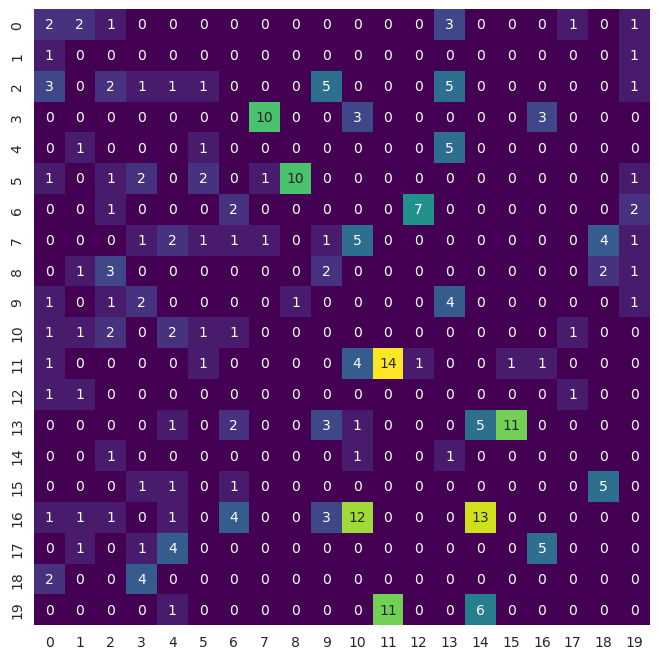

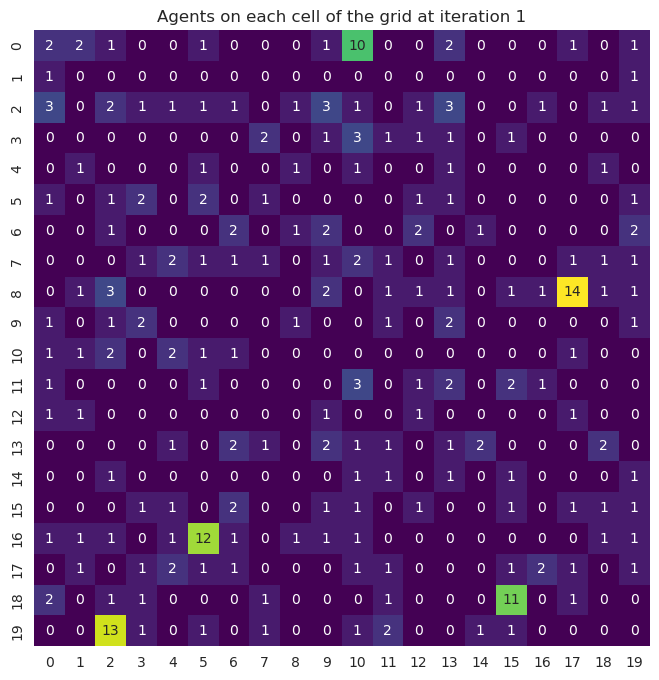

In [263]:
fig, axs = plt.subplots(figsize=(8, 8))
g = sns.heatmap(warehouse_df2.iloc[ITERATIONS - 1]["Grid"], cmap="viridis", annot=True, cbar=False, square=True, ax=axs)
f, ax = plt.subplots(figsize=(8, 8))

def animate(i):
    ax.clear()
    frame = sns.heatmap(warehouse_df2.iloc[i]["Grid"], cmap="viridis", annot=True, cbar=False, square=True, ax=ax)
    ax.set(title=f"Agents on each cell of the grid at iteration {i + 1}")


anim = animation.FuncAnimation(f, animate, frames=ITERATIONS)

In [264]:
anim